# Food Industry Portfolio Risk and Returns

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

import warnings
warnings.filterwarnings("ignore")

# fix_yahoo_finance is used to fetch data 
import yfinance as yf
yf.pdr_override()

In [2]:
# input
# Packaged Foods Stock
symbols = ['GIS','K','KHC','JJSF','BGS','UN','FLO','FARM','FAMI','FRPT','FTFT','TSN','TWNK','INGR','SJM','PEP','KO','RIBT','CPB','CAG','MKC-V','MKC','MDLZ','BYND','APRN','JVA','HRL','HAIN','JBSS','LW','LANC','LNDC','LWAY','MDLZ','HSY','SENEA','SENEB','PETZ','SMPL']
start = '2019-12-01'
end = '2020-03-31'

In [3]:
df = pd.DataFrame()
for s in symbols:
    df[s] = yf.download(s,start,end)['Adj Close']

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

In [4]:
from datetime import datetime
from dateutil import relativedelta

d1 = datetime.strptime(start, "%Y-%m-%d")
d2 = datetime.strptime(end, "%Y-%m-%d")
delta = relativedelta.relativedelta(d2,d1)
print('How many years of investing?')
print('%s years' % delta.years)

How many years of investing?
0 years


In [5]:
number_of_years = delta.years

In [6]:
days = (df.index[-1] - df.index[0]).days
days

119

In [7]:
df.head()

,GIS,K,KHC,JJSF,BGS,UN,FLO,FARM,FAMI,FRPT,...,JBSS,LW,LANC,LNDC,LWAY,HSY,SENEA,SENEB,PETZ,SMPL
Date,,,,,,,,,,,,,,,,,,,,,
2019-12-02,52.985374,64.803337,30.426756,182.889145,15.700662,58.887077,21.375975,15.00,1.20,52.549999,...,97.699997,83.820038,156.082001,11.36,1.93,148.242538,38.939999,37.000000,1.635,28.080000
2019-12-03,53.153805,65.031174,30.279289,185.559265,15.700662,58.916847,21.336317,15.05,1.17,52.430000,...,98.339996,84.199097,156.736053,11.30,1.87,148.083313,39.070000,37.000000,1.600,27.719999
2019-12-04,52.807037,65.110420,30.505404,186.710709,15.719588,59.244331,21.504866,14.95,1.14,54.820000,...,97.839996,83.919785,157.112625,11.26,1.88,149.436768,38.099998,37.000000,1.440,28.180000
2019-12-05,53.401493,65.130226,30.721684,186.621368,15.908867,59.214558,21.633755,14.94,1.10,57.369999,...,97.970001,84.199097,157.242035,11.18,1.92,149.247681,37.849998,38.049999,1.490,28.010000
2019-12-06,52.816948,65.595802,30.564388,187.405533,16.372599,59.472572,21.722986,15.41,1.11,56.709999,...,98.019997,84.009567,157.431152,11.11,1.88,148.531143,38.110001,37.790001,1.610,28.110001


In [8]:
df.tail()

,GIS,K,KHC,JJSF,BGS,UN,FLO,FARM,FAMI,FRPT,...,JBSS,LW,LANC,LNDC,LWAY,HSY,SENEA,SENEB,PETZ,SMPL
Date,,,,,,,,,,,,,,,,,,,,,
2020-03-24,48.230000,56.270000,22.990000,125.760002,16.713692,45.549999,19.049999,7.63,0.48,59.160000,...,77.699997,55.040001,127.919998,8.10,1.83,121.919998,35.099998,35.820000,0.799,15.660000
2020-03-25,47.650002,56.169998,22.959999,118.650002,16.033482,45.770000,17.740000,7.53,0.55,57.750000,...,74.949997,56.330002,129.589996,7.69,1.85,126.139999,36.270000,35.820000,0.830,15.450000
2020-03-26,50.000000,58.759998,24.770000,118.760002,16.266697,47.759998,19.580000,7.76,0.55,63.450001,...,76.989998,58.840000,137.020004,7.84,1.89,132.449997,34.520000,33.029999,0.900,16.870001
2020-03-27,51.820000,59.470001,24.240000,114.559998,16.324999,47.290001,19.540001,7.06,0.53,58.939999,...,75.099998,57.250000,133.699997,7.85,1.87,130.839996,34.110001,33.029999,0.950,16.299999
2020-03-30,54.099998,60.910000,25.170000,124.040001,16.860001,48.459999,21.080000,7.00,0.51,64.059998,...,84.790001,57.639999,137.839996,8.47,1.84,137.779999,37.119999,33.419998,1.000,17.540001


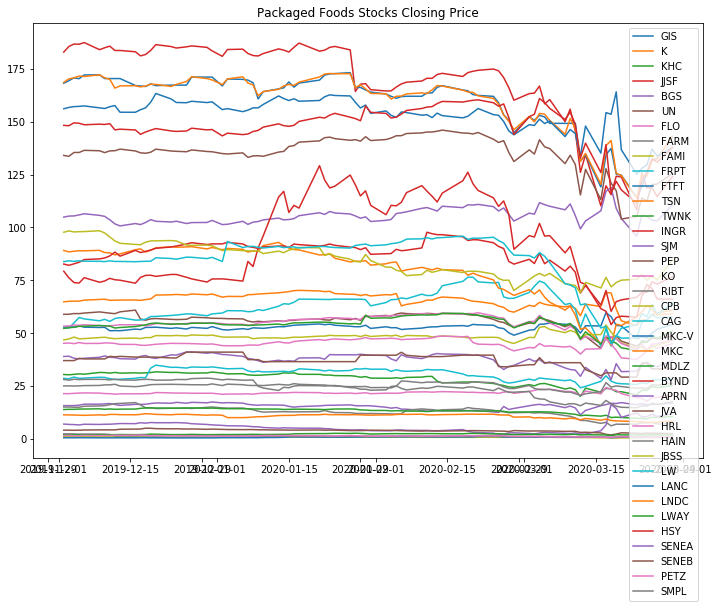

In [9]:
plt.figure(figsize=(12,8))
plt.plot(df)
plt.title('Packaged Foods Stocks Closing Price')
plt.legend(labels=df.columns)

In [10]:
# Normalize the data
normalize = (df - df.min())/ (df.max() - df.min())

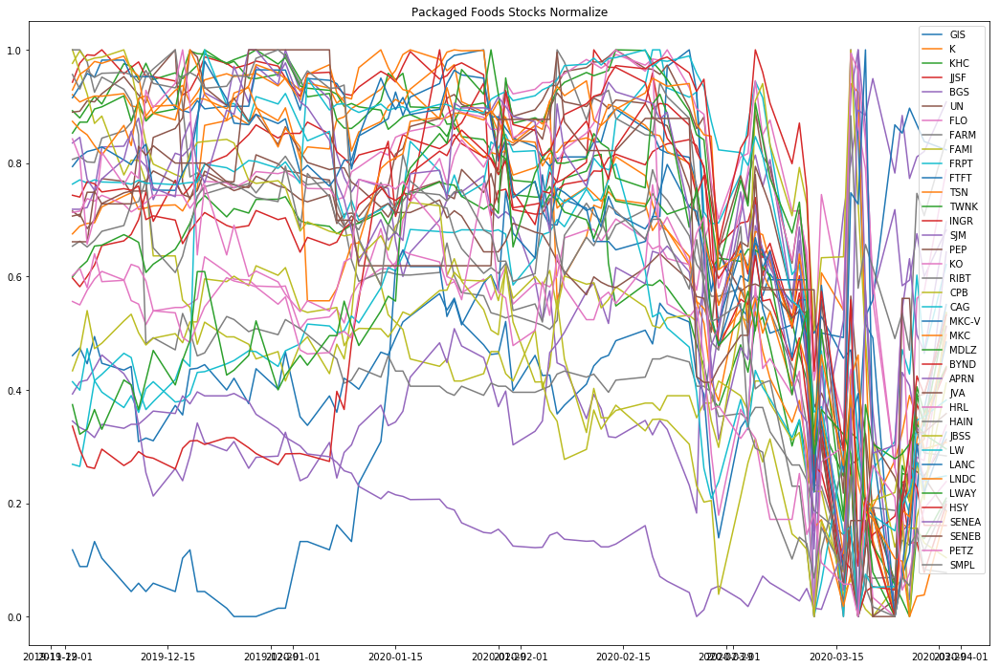

In [11]:
plt.figure(figsize=(18,12))
plt.plot(normalize)
plt.title('Packaged Foods Stocks Normalize')
plt.legend(labels=normalize.columns)

In [12]:
stock_rets = df.pct_change().dropna()

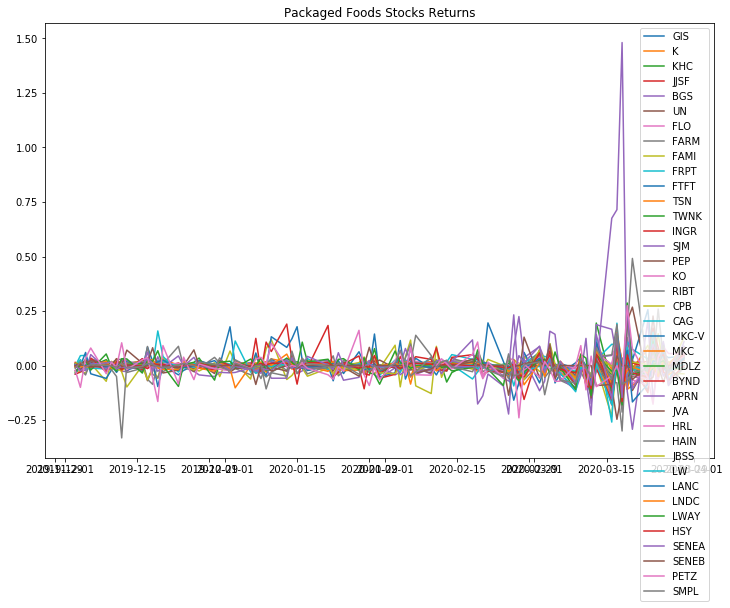

In [13]:
plt.figure(figsize=(12,8))
plt.plot(stock_rets)
plt.title('Packaged Foods Stocks Returns')
plt.legend(labels=stock_rets.columns)

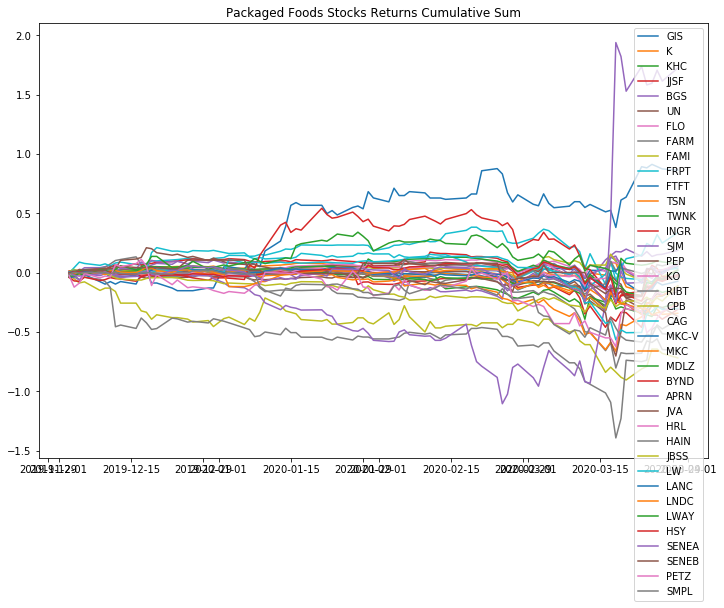

In [14]:
plt.figure(figsize=(12,8))
plt.plot(stock_rets.cumsum())
plt.title('Packaged Foods Stocks Returns Cumulative Sum')
plt.legend(labels=stock_rets.columns)

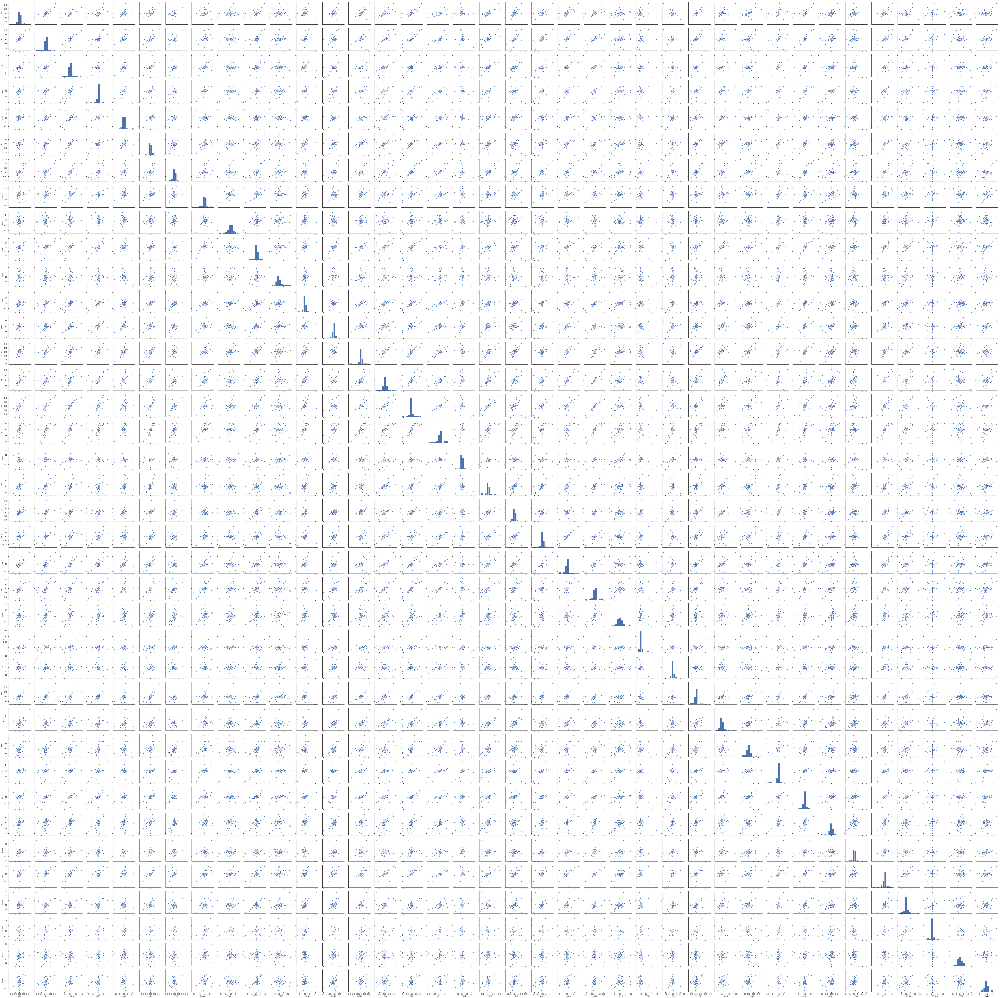

In [15]:
sns.set(style='ticks')
ax = sns.pairplot(stock_rets, diag_kind='hist')

nplot = len(stock_rets.columns)
for i in range(nplot) :
    for j in range(nplot) :
        ax.axes[i, j].locator_params(axis='x', nbins=6, tight=True)

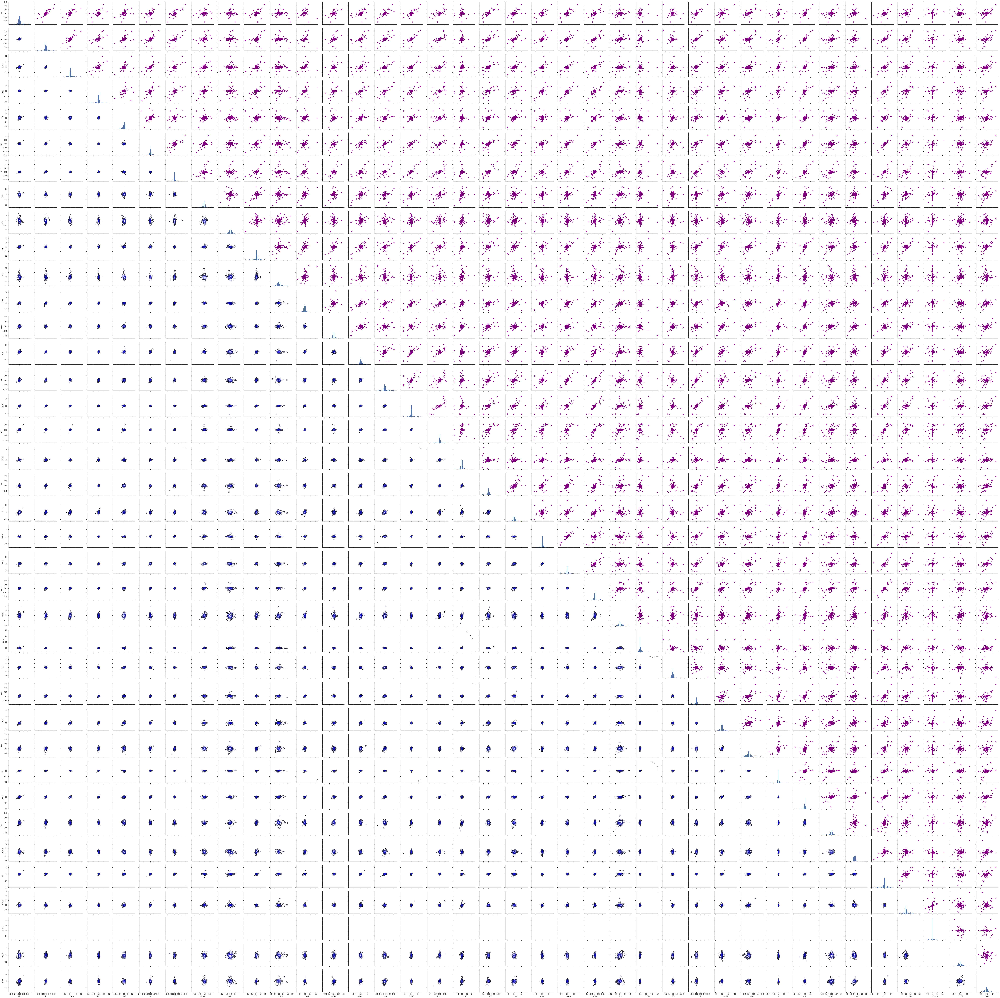

In [16]:
ax = sns.PairGrid(stock_rets)
ax.map_upper(plt.scatter, color='purple')
ax.map_lower(sns.kdeplot, color='blue')
ax.map_diag(plt.hist, bins=30)
for i in range(nplot) :
    for j in range(nplot) :
        ax.axes[i, j].locator_params(axis='x', nbins=6, tight=True)

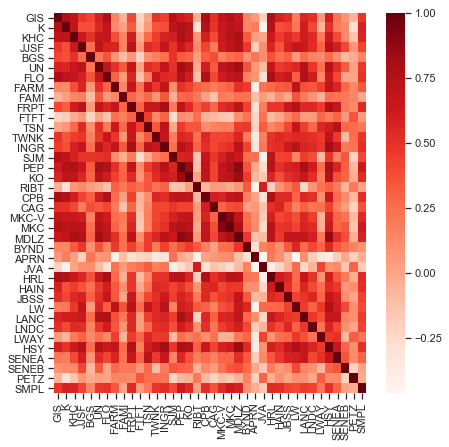

In [17]:
plt.figure(figsize=(7,7))
corr = stock_rets.corr()

# plot the heatmap
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns,
            cmap="Reds")

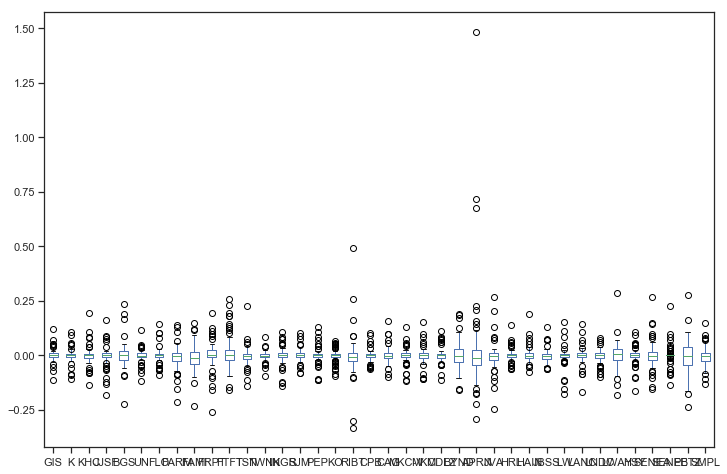

In [18]:
# Box plot
stock_rets.plot(kind='box',figsize=(12,8))

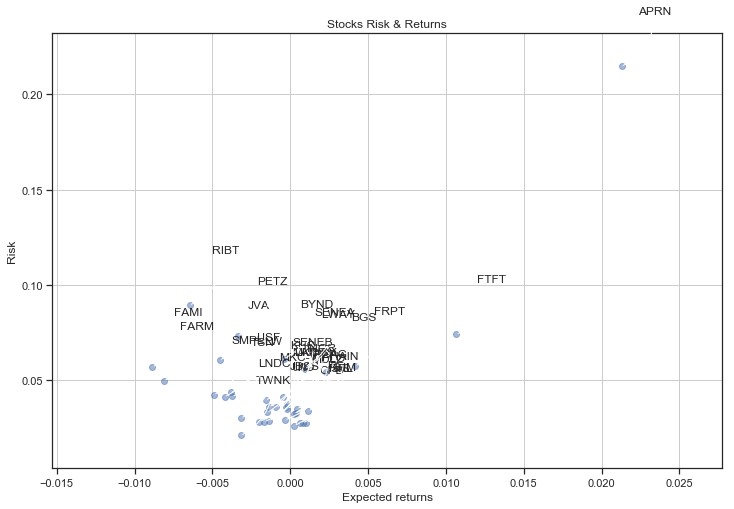

In [19]:
rets = stock_rets.dropna()

plt.figure(figsize=(12,8))
plt.scatter(rets.mean(), rets.std(),alpha = 0.5)

plt.title('Stocks Risk & Returns')
plt.xlabel('Expected returns')
plt.ylabel('Risk')
plt.grid(which='major')

for label, x, y in zip(rets.columns, rets.mean(), rets.std()):
    plt.annotate(
        label, 
        xy = (x, y), xytext = (50, 50),
        textcoords = 'offset points', ha = 'right', va = 'bottom',
        arrowprops = dict(arrowstyle = '-', connectionstyle = 'arc3,rad=-0.3'))

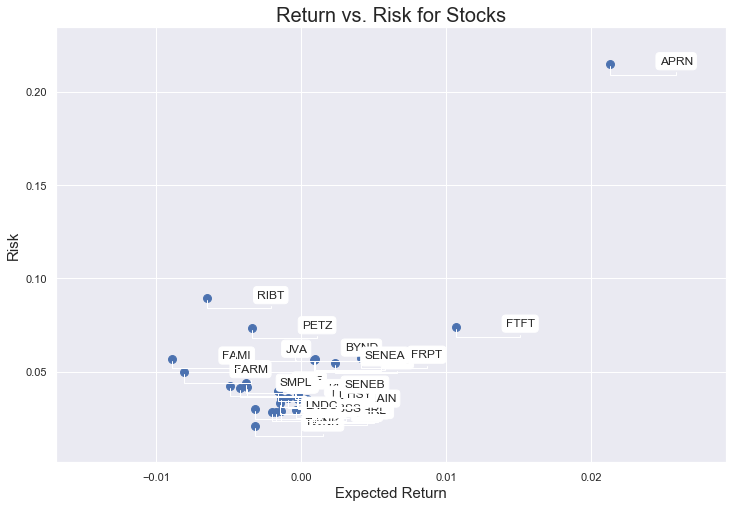

In [20]:
rets = stock_rets.dropna()
area = np.pi*20.0

sns.set(style='darkgrid')
plt.figure(figsize=(12,8))
plt.scatter(rets.mean(), rets.std(), s=area)
plt.xlabel("Expected Return", fontsize=15)
plt.ylabel("Risk", fontsize=15)
plt.title("Return vs. Risk for Stocks", fontsize=20)

for label, x, y in zip(rets.columns, rets.mean(), rets.std()) : 
    plt.annotate(label, xy=(x,y), xytext=(50, 0), textcoords='offset points',
                arrowprops=dict(arrowstyle='-', connectionstyle='bar,angle=180,fraction=-0.2'),
                bbox=dict(boxstyle="round", fc="w"))

In [21]:
rest_rets = rets.corr()
pair_value = rest_rets.abs().unstack()
pair_value.sort_values(ascending = False)

SMPL   SMPL     1.000000
CPB    CPB      1.000000
MKC-V  MKC-V    1.000000
MKC    MKC      1.000000
MDLZ   MDLZ     1.000000
BYND   BYND     1.000000
APRN   APRN     1.000000
JVA    JVA      1.000000
HRL    HRL      1.000000
HAIN   HAIN     1.000000
JBSS   JBSS     1.000000
LW     LW       1.000000
LANC   LANC     1.000000
LNDC   LNDC     1.000000
LWAY   LWAY     1.000000
HSY    HSY      1.000000
SENEA  SENEA    1.000000
CAG    CAG      1.000000
RIBT   RIBT     1.000000
PETZ   PETZ     1.000000
KO     KO       1.000000
K      K        1.000000
KHC    KHC      1.000000
JJSF   JJSF     1.000000
BGS    BGS      1.000000
UN     UN       1.000000
FLO    FLO      1.000000
FARM   FARM     1.000000
FAMI   FAMI     1.000000
FRPT   FRPT     1.000000
                  ...   
TSN    SJM      0.013787
SJM    TSN      0.013787
RIBT   MKC      0.013185
MKC    RIBT     0.013185
UN     FTFT     0.012890
FTFT   UN       0.012890
RIBT   UN       0.012822
UN     RIBT     0.012822
APRN   CPB      0.011722


In [22]:
# Normalized Returns Data
Normalized_Value = ((rets[:] - rets[:].min()) /(rets[:].max() - rets[:].min()))
Normalized_Value.head()

,GIS,K,KHC,JJSF,BGS,UN,FLO,FARM,FAMI,FRPT,...,JBSS,LW,LANC,LNDC,LWAY,HSY,SENEA,SENEB,PETZ,SMPL
Date,,,,,,,,,,,,,,,,,,,,,
2019-12-03,0.505675,0.522647,0.399195,0.572917,0.492692,0.509384,0.382116,0.615384,0.549450,0.566319,...,0.367973,0.551316,0.553765,0.534564,0.319575,0.608477,0.371064,0.374453,0.424277,0.432655
2019-12-04,0.463843,0.511994,0.436232,0.548249,0.495324,0.531369,0.424315,0.587074,0.547760,0.671877,...,0.307931,0.527726,0.547974,0.544185,0.397597,0.646326,0.304342,0.374453,0.271451,0.537843
2019-12-05,0.540503,0.507754,0.435096,0.528608,0.518977,0.504997,0.416069,0.604028,0.522846,0.673930,...,0.341026,0.547723,0.542861,0.524493,0.431706,0.607768,0.347612,0.452610,0.533422,0.456928
2019-12-06,0.444776,0.539491,0.398373,0.542362,0.556324,0.526142,0.407985,0.695186,0.639361,0.545985,...,0.336802,0.530935,0.544088,0.529153,0.341534,0.594666,0.379429,0.355634,0.622510,0.491268
2019-12-09,0.479838,0.528751,0.495032,0.477249,0.493954,0.547115,0.370398,0.631704,0.425304,0.536747,...,0.354174,0.535564,0.521763,0.673117,0.500047,0.619657,0.391128,0.374453,0.393436,0.481045


In [23]:
Normalized_Value.corr()

,GIS,K,KHC,JJSF,BGS,UN,FLO,FARM,FAMI,FRPT,...,JBSS,LW,LANC,LNDC,LWAY,HSY,SENEA,SENEB,PETZ,SMPL
GIS,1.000000,0.769128,0.687784,0.478029,0.412663,0.587583,0.773598,0.151421,-0.052954,0.404406,...,0.525643,0.191329,0.565416,0.512615,0.054417,0.597010,0.218447,0.081454,-0.059233,0.482166
K,0.769128,1.000000,0.692747,0.388173,0.381947,0.563398,0.690337,0.121662,0.033961,0.330052,...,0.414809,0.217010,0.615195,0.402064,-0.063585,0.493265,0.179368,0.129492,-0.272727,0.577377
KHC,0.687784,0.692747,1.000000,0.638835,0.502046,0.657097,0.666358,0.381291,0.152780,0.614688,...,0.544668,0.464988,0.611723,0.537854,0.198885,0.623840,0.390515,0.127395,-0.139635,0.568058
JJSF,0.478029,0.388173,0.638835,1.000000,0.257161,0.703323,0.580317,0.570769,0.169874,0.725311,...,0.577337,0.674227,0.635642,0.522141,0.301066,0.734534,0.599291,0.411072,0.068334,0.413804
BGS,0.412663,0.381947,0.502046,0.257161,1.000000,0.222742,0.360778,0.069322,-0.096917,0.058109,...,0.307508,0.052893,0.260107,0.162331,0.131127,0.258606,0.094634,-0.090678,-0.023373,0.137775
UN,0.587583,0.563398,0.657097,0.703323,0.222742,1.000000,0.680582,0.513415,0.334284,0.672694,...,0.510495,0.558249,0.745754,0.490179,0.250711,0.738474,0.530334,0.330778,0.027169,0.465801
FLO,0.773598,0.690337,0.666358,0.580317,0.360778,0.680582,1.000000,0.301965,0.055588,0.567647,...,0.648438,0.318275,0.761188,0.613335,0.142639,0.633370,0.406570,-0.004835,0.011066,0.494025
FARM,0.151421,0.121662,0.381291,0.570769,0.069322,0.513415,0.301965,1.000000,0.146460,0.681127,...,0.343456,0.713094,0.373073,0.346103,0.445000,0.675452,0.567823,0.276575,0.139810,0.348291
FAMI,-0.052954,0.033961,0.152780,0.169874,-0.096917,0.334284,0.055588,0.146460,1.000000,0.290746,...,-0.004321,0.361687,0.201561,0.087723,-0.047787,0.252905,0.228292,0.203460,0.149060,-0.000920
FRPT,0.404406,0.330052,0.614688,0.725311,0.058109,0.672694,0.567647,0.681127,0.290746,1.000000,...,0.644852,0.733709,0.550384,0.551184,0.455473,0.764812,0.658967,0.201148,0.121266,0.546023


In [24]:
normalized_rets = Normalized_Value.corr()
normalized_pair_value = normalized_rets.abs().unstack()
normalized_pair_value.sort_values(ascending = False)

SMPL   SMPL     1.000000
CPB    CPB      1.000000
MKC-V  MKC-V    1.000000
MKC    MKC      1.000000
MDLZ   MDLZ     1.000000
BYND   BYND     1.000000
APRN   APRN     1.000000
JVA    JVA      1.000000
HRL    HRL      1.000000
HAIN   HAIN     1.000000
JBSS   JBSS     1.000000
LW     LW       1.000000
LANC   LANC     1.000000
LNDC   LNDC     1.000000
LWAY   LWAY     1.000000
HSY    HSY      1.000000
SENEA  SENEA    1.000000
CAG    CAG      1.000000
RIBT   RIBT     1.000000
PETZ   PETZ     1.000000
KO     KO       1.000000
K      K        1.000000
KHC    KHC      1.000000
JJSF   JJSF     1.000000
BGS    BGS      1.000000
UN     UN       1.000000
FLO    FLO      1.000000
FARM   FARM     1.000000
FAMI   FAMI     1.000000
FRPT   FRPT     1.000000
                  ...   
TSN    SJM      0.013787
SJM    TSN      0.013787
RIBT   MKC      0.013185
MKC    RIBT     0.013185
UN     FTFT     0.012890
FTFT   UN       0.012890
RIBT   UN       0.012822
UN     RIBT     0.012822
APRN   CPB      0.011722


In [25]:
print("Stock returns: ")
print(rets.mean())
print('-' * 50)
print("Stock risks:")
print(rets.std())

Stock returns: 
GIS      0.000638
K       -0.000339
KHC     -0.001580
JJSF    -0.003810
BGS      0.002326
UN      -0.002004
FLO      0.000346
FARM    -0.008093
FAMI    -0.008857
FRPT     0.004165
FTFT     0.010679
TSN     -0.004212
TWNK    -0.003166
INGR    -0.000201
SJM      0.001043
PEP     -0.000200
KO      -0.001684
RIBT    -0.006463
CPB      0.000264
CAG      0.000443
MKC-V   -0.001474
MKC     -0.001377
MDLZ     0.000252
BYND    -0.000416
APRN     0.021291
JVA     -0.004530
HRL      0.000794
HAIN     0.001164
JBSS    -0.001348
LW      -0.003728
LANC    -0.000889
LNDC    -0.003159
LWAY     0.000929
HSY     -0.000241
SENEA    0.000957
SENEB   -0.000433
PETZ    -0.003382
SMPL    -0.004901
dtype: float64
--------------------------------------------------
Stock risks:
GIS      0.027750
K        0.029238
KHC      0.039620
JJSF     0.043666
BGS      0.054455
UN       0.028218
FLO      0.032790
FARM     0.049732
FAMI     0.057021
FRPT     0.057475
FTFT     0.074106
TSN      0.041435
TWNK 

In [26]:
table = pd.DataFrame()
table['Returns'] = rets.mean()
table['Risk'] = rets.std()
table.sort_values(by='Returns')

,Returns,Risk
FAMI,-0.008857,0.057021
FARM,-0.008093,0.049732
RIBT,-0.006463,0.089387
SMPL,-0.004901,0.042460
JVA,-0.004530,0.060649
TSN,-0.004212,0.041435
JJSF,-0.003810,0.043666
LW,-0.003728,0.041508
PETZ,-0.003382,0.073250
TWNK,-0.003166,0.021131


In [27]:
table.sort_values(by='Risk')

,Returns,Risk
TWNK,-0.003166,0.021131
CPB,0.000264,0.026241
HRL,0.000794,0.027598
GIS,0.000638,0.027750
SJM,0.001043,0.027831
KO,-0.001684,0.028198
UN,-0.002004,0.028218
JBSS,-0.001348,0.028784
K,-0.000339,0.029238
LNDC,-0.003159,0.030187


In [28]:
rf = 0.01
table['Sharpe Ratio'] = (table['Returns'] - rf) / table['Risk']
table

,Returns,Risk,Sharpe Ratio
GIS,0.000638,0.027750,-0.337387
K,-0.000339,0.029238,-0.353613
KHC,-0.001580,0.039620,-0.292285
JJSF,-0.003810,0.043666,-0.316258
BGS,0.002326,0.054455,-0.140922
UN,-0.002004,0.028218,-0.425416
FLO,0.000346,0.032790,-0.294409
FARM,-0.008093,0.049732,-0.363808
FAMI,-0.008857,0.057021,-0.330700
FRPT,0.004165,0.057475,-0.101516


In [29]:
table['Max Returns'] = rets.max()

In [30]:
table['Min Returns'] = rets.min()

In [31]:
table['Median Returns'] = rets.median()

In [32]:
total_return = stock_rets[-1:].transpose()
table['Total Return'] = 100 * total_return
table

,Returns,Risk,Sharpe Ratio,Max Returns,Min Returns,Median Returns,Total Return
GIS,0.000638,0.027750,-0.337387,0.117834,-0.114109,0.000376,4.399843
K,-0.000339,0.029238,-0.353613,0.106458,-0.109194,0.000906,2.421387
KHC,-0.001580,0.039620,-0.292285,0.194915,-0.137575,-0.001305,3.836635
JJSF,-0.003810,0.043666,-0.316258,0.159934,-0.180361,0.001342,8.275143
BGS,0.002326,0.054455,-0.140922,0.232394,-0.225699,0.000612,3.277193
UN,-0.002004,0.028218,-0.425416,0.113265,-0.116567,-0.001878,2.474092
FLO,0.000346,0.032790,-0.294409,0.140977,-0.090187,0.000000,7.881264
FARM,-0.008093,0.049732,-0.363808,0.138889,-0.213555,-0.004223,-0.849858
FAMI,-0.008857,0.057021,-0.330700,0.145833,-0.233333,-0.011905,-3.773582
FRPT,0.004165,0.057475,-0.101516,0.194381,-0.259096,0.002280,8.686799


In [33]:
table['Average Return Days'] = (1 + total_return)**(1 / days) - 1
table

,Returns,Risk,Sharpe Ratio,Max Returns,Min Returns,Median Returns,Total Return,Average Return Days
GIS,0.000638,0.027750,-0.337387,0.117834,-0.114109,0.000376,4.399843,0.000362
K,-0.000339,0.029238,-0.353613,0.106458,-0.109194,0.000906,2.421387,0.000201
KHC,-0.001580,0.039620,-0.292285,0.194915,-0.137575,-0.001305,3.836635,0.000316
JJSF,-0.003810,0.043666,-0.316258,0.159934,-0.180361,0.001342,8.275143,0.000668
BGS,0.002326,0.054455,-0.140922,0.232394,-0.225699,0.000612,3.277193,0.000271
UN,-0.002004,0.028218,-0.425416,0.113265,-0.116567,-0.001878,2.474092,0.000205
FLO,0.000346,0.032790,-0.294409,0.140977,-0.090187,0.000000,7.881264,0.000638
FARM,-0.008093,0.049732,-0.363808,0.138889,-0.213555,-0.004223,-0.849858,-0.000072
FAMI,-0.008857,0.057021,-0.330700,0.145833,-0.233333,-0.011905,-3.773582,-0.000323
FRPT,0.004165,0.057475,-0.101516,0.194381,-0.259096,0.002280,8.686799,0.000700


In [34]:
initial_value = df.iloc[0]
ending_value = df.iloc[-1]
table['CAGR'] = ((ending_value / initial_value) ** (252.0 / days)) -1
table

,Returns,Risk,Sharpe Ratio,Max Returns,Min Returns,Median Returns,Total Return,Average Return Days,CAGR
GIS,0.000638,0.027750,-0.337387,0.117834,-0.114109,0.000376,4.399843,0.000362,0.045072
K,-0.000339,0.029238,-0.353613,0.106458,-0.109194,0.000906,2.421387,0.000201,-0.122965
KHC,-0.001580,0.039620,-0.292285,0.194915,-0.137575,-0.001305,3.836635,0.000316,-0.330787
JJSF,-0.003810,0.043666,-0.316258,0.159934,-0.180361,0.001342,8.275143,0.000668,-0.560550
BGS,0.002326,0.054455,-0.140922,0.232394,-0.225699,0.000612,3.277193,0.000271,0.162838
UN,-0.002004,0.028218,-0.425416,0.113265,-0.116567,-0.001878,2.474092,0.000205,-0.338135
FLO,0.000346,0.032790,-0.294409,0.140977,-0.090187,0.000000,7.881264,0.000638,-0.029094
FARM,-0.008093,0.049732,-0.363808,0.138889,-0.213555,-0.004223,-0.849858,-0.000072,-0.800899
FAMI,-0.008857,0.057021,-0.330700,0.145833,-0.233333,-0.011905,-3.773582,-0.000323,-0.836673
FRPT,0.004165,0.057475,-0.101516,0.194381,-0.259096,0.002280,8.686799,0.000700,0.521065


In [35]:
table.sort_values(by='Average Return Days')

,Returns,Risk,Sharpe Ratio,Max Returns,Min Returns,Median Returns,Total Return,Average Return Days,CAGR
JVA,-0.004530,0.060649,-0.239583,0.267857,-0.246429,-0.002740,-7.196972,-0.000627,-0.663909
FAMI,-0.008857,0.057021,-0.330700,0.145833,-0.233333,-0.011905,-3.773582,-0.000323,-0.836673
LWAY,0.000929,0.056047,-0.161839,0.286667,-0.180328,0.004132,-1.604277,-0.000136,-0.096182
FTFT,0.010679,0.074106,0.009157,0.256098,-0.158879,0.000000,-0.990098,-0.000084,2.993969
RIBT,-0.006463,0.089387,-0.184172,0.491228,-0.331731,-0.009709,-0.970873,-0.000082,-0.830755
FARM,-0.008093,0.049732,-0.363808,0.138889,-0.213555,-0.004223,-0.849858,-0.000072,-0.800899
BYND,-0.000416,0.061269,-0.170012,0.190174,-0.157542,-0.003113,-0.045382,-0.000004,-0.319602
LW,-0.003728,0.041508,-0.330730,0.153637,-0.178700,-0.000110,0.681222,0.000057,-0.547499
TSN,-0.004212,0.041435,-0.343005,0.227026,-0.142068,-0.001892,0.955797,0.000080,-0.579534
CAG,0.000443,0.035099,-0.272271,0.158692,-0.099590,-0.003601,1.110313,0.000093,-0.025461
